## If needed, install dependencies like so:

In [ ]:
!pip install pandoc jupyterlab matplotlib numpy scipy notebook nbconvert mne


## This is merely helpful to demonstrate why some code cannot run in jupyter notebook.  In these instances, like when we want interactive graphs, we must use the traditional method of running python code in order for it to operate.  This is due to environment variable differences between how the python interpreter is run

In [ ]:
import os
import glob
import mne
import matplotlib.pyplot as plt
from datetime import datetime
import shutil

def plot_psd(edf_file, output_directory):
    try:
        # Load the EDF/BDF file
        raw = mne.io.read_raw_edf(edf_file, preload=True)
        
        # Create a plot of the PSD
        fig = raw.plot_psd(show=False)
        
        # Save the plot to a PNG file
        output_filename = os.path.basename(edf_file).replace('.edf', '').replace('.bdf', '') + '_psd.png'
        output_path = os.path.join(output_directory, output_filename)
        fig.savefig(output_path)
        plt.close(fig)  # Close the figure to free up memory
        print(f"Saved PSD plot for {edf_file} to {output_path}")
        
    except Exception as e:
        print(f"Error processing {edf_file}: {e}")

def find_edf_files(parent_directory):
    extensions = ['*.bdf', '*.edf', '*.edf+']
    edf_files = []
    for ext in extensions:
        edf_files.extend(glob.glob(os.path.join(parent_directory, '**', ext), recursive=True))
    return edf_files

def main(parent_directory, output_directory):
    edf_files = find_edf_files(parent_directory)

    for edf_file in edf_files:
        print(f"Processing file: {edf_file}")
        plot_psd(edf_file, output_directory)

if __name__ == '__main__':
    parent_directory = 'EDF+'
    output_directory = 'PSD_Plots'
    
    # Create a timestamped subfolder in the output directory
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
    timestamped_output_directory = os.path.join(output_directory, timestamp)
    os.makedirs(timestamped_output_directory, exist_ok=True)

    ###
    ###
    ###
    
    #WE CANNOT DO THIS in jupyter notebook.  
    
    
    # Save a copy of the script into the timestamped subfolder
    # script_path = '' #os.path.realpath(__file__)
    # shutil.copy(script_path, os.path.join(timestamped_output_directory, os.path.basename(script_path)))

    main(parent_directory, timestamped_output_directory)


## Let's inspect the methods we have available with mne python by inspecting the raw object created earlier

In [16]:
import mne

raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )



for i in dir(raw):
    if '_' in i:
        continue
    print(i)

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
annotations
anonymize
append
close
copy
crop
describe
export
filenames
filter
info
pick
plot
preload
proj
resample
save
times


## Let's inspect events

In [4]:
import mne
import numpy as np

# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )


events, event_dict = mne.events_from_annotations(raw)

# Define baseline period (0 to 30 seconds)
baseline_start = 0
baseline_end = 30

# Get time periods for events with "videos\" in their descriptions, skipping the first 30 seconds
sfreq = raw.info['sfreq']  # Get the sampling frequency
time_periods = []
video_events = []
for event_idx, event in enumerate(events):
    onset_sample = event[0]
    duration_seconds = event[2] / sfreq
    event_description = list(event_dict.keys())[list(event_dict.values()).index(event[2])]
    if "videos\\" in event_description:
        start_time = raw.times[onset_sample] + 30  # Skip the first 30 seconds
        end_time = start_time + 30  # Grab the subsequent 30 seconds
        time_period = (start_time, end_time)
        time_periods.append(time_period)
        video_events.append((event_description, time_period))

# Extract baseline period
baseline_data, _ = raw[:, int(baseline_start * sfreq):int(baseline_end * sfreq)]

# Print video events with their corresponding time periods
for event_idx, (event_description, time_period) in enumerate(video_events):
    print(f"Event {event_idx + 1}: {event_description}, Time Period: {time_period[0]} - {time_period[1]} seconds")


Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\103918\103918.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
Used Annotations descriptions: ['neutralVideo,neutralVideo,-1,12', 'neutralVideo,neutralVideo,-1,15', 'neutralVideo,neutralVideo,-1,18', 'neutralVideo,neutralVideo,-1,21', 'neutralVideo,neutralVideo,-1,24', 'neutralVideo,neutralVideo,-1,3', 'neutralVideo,neutralVideo,-1,6', 'neutralVideo,neutralVideo,-1,9', 'rating,rating,-1,11', 'rating,rating,-1,14', 'rating,rating,-1,17', 'rating,rating,-1,2', 'rating,rating,-1,20', 'rating,rating,-1,23', 'rating,rating,-1,5', 'rating,rating,-1,8', 'videos\\1 excited\\1 motorsports\\kenMiles.mp4,videos\\1 excited\\1 motorsports\\kenMiles.mp4,-1,1', 'videos\\2 happy\\scooby.mp4,videos\\2 happy\\scooby.mp4,-1,4', 'videos\\3 motivated\\motivationalAuthor.mp4,videos\\3 motivated\\motivationalAuthor.mp4,-1,7', 'videos\\4 relaxed\\2 natur

Extracting EDF parameters from r:\FINAL_EDF_REPO\EDF_analysis\Archive\EDF+\254362\254362.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...


Used Annotations descriptions: [np.str_('neutralVideo,neutralVideo,-1,12'), np.str_('neutralVideo,neutralVideo,-1,15'), np.str_('neutralVideo,neutralVideo,-1,18'), np.str_('neutralVideo,neutralVideo,-1,21'), np.str_('neutralVideo,neutralVideo,-1,24'), np.str_('neutralVideo,neutralVideo,-1,3'), np.str_('neutralVideo,neutralVideo,-1,6'), np.str_('neutralVideo,neutralVideo,-1,9'), np.str_('rating,rating,-1,11'), np.str_('rating,rating,-1,14'), np.str_('rating,rating,-1,17'), np.str_('rating,rating,-1,2'), np.str_('rating,rating,-1,20'), np.str_('rating,rating,-1,23'), np.str_('rating,rating,-1,5'), np.str_('rating,rating,-1,8'), np.str_('videos\\1 excited\\1 motorsports\\kenMiles.mp4,videos\\1 excited\\1 motorsports\\kenMiles.mp4,-1,1'), np.str_('videos\\2 happy\\scooby.mp4,videos\\2 happy\\scooby.mp4,-1,4'), np.str_('videos\\3 motivated\\motivationalAuthor.mp4,videos\\3 motivated\\motivationalAuthor.mp4,-1,7'), np.str_('videos\\4 relaxed\\3 general\\asmr.mkv,videos\\4 relaxed\\3 general\

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  14 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done  32 out of  32 | elapsed:    4.3s finished


Event 1: videos\1 excited\1 motorsports\kenMiles.mp4,videos\1 excited\1 motorsports\kenMiles.mp4,-1,1, Time Period: 114.421875 - 144.421875 seconds
Event 2: videos\2 happy\scooby.mp4,videos\2 happy\scooby.mp4,-1,4, Time Period: 259.2421875 - 289.2421875 seconds
Event 3: videos\3 motivated\motivationalAuthor.mp4,videos\3 motivated\motivationalAuthor.mp4,-1,7, Time Period: 392.1875 - 422.1875 seconds
Event 4: videos\4 relaxed\3 general\asmr.mkv,videos\4 relaxed\3 general\asmr.mkv,-1,10, Time Period: 532.640625 - 562.640625 seconds
Event 5: videos\5 sad\1 animals\saddogs.mp4,videos\5 sad\1 animals\saddogs.mp4,-1,13, Time Period: 666.9609375 - 696.9609375 seconds
Event 6: videos\6 horror\conjuring.mp4,videos\6 horror\conjuring.mp4,-1,16, Time Period: 804.0390625 - 834.0390625 seconds
Event 7: videos\7 disgusted\trainspotting.mp4,videos\7 disgusted\trainspotting.mp4,-1,19, Time Period: 941.859375 - 971.859375 seconds
Event 8: videos\8 angry\1 animals\angrydogs.mp4,videos\8 angry\1 animals\a

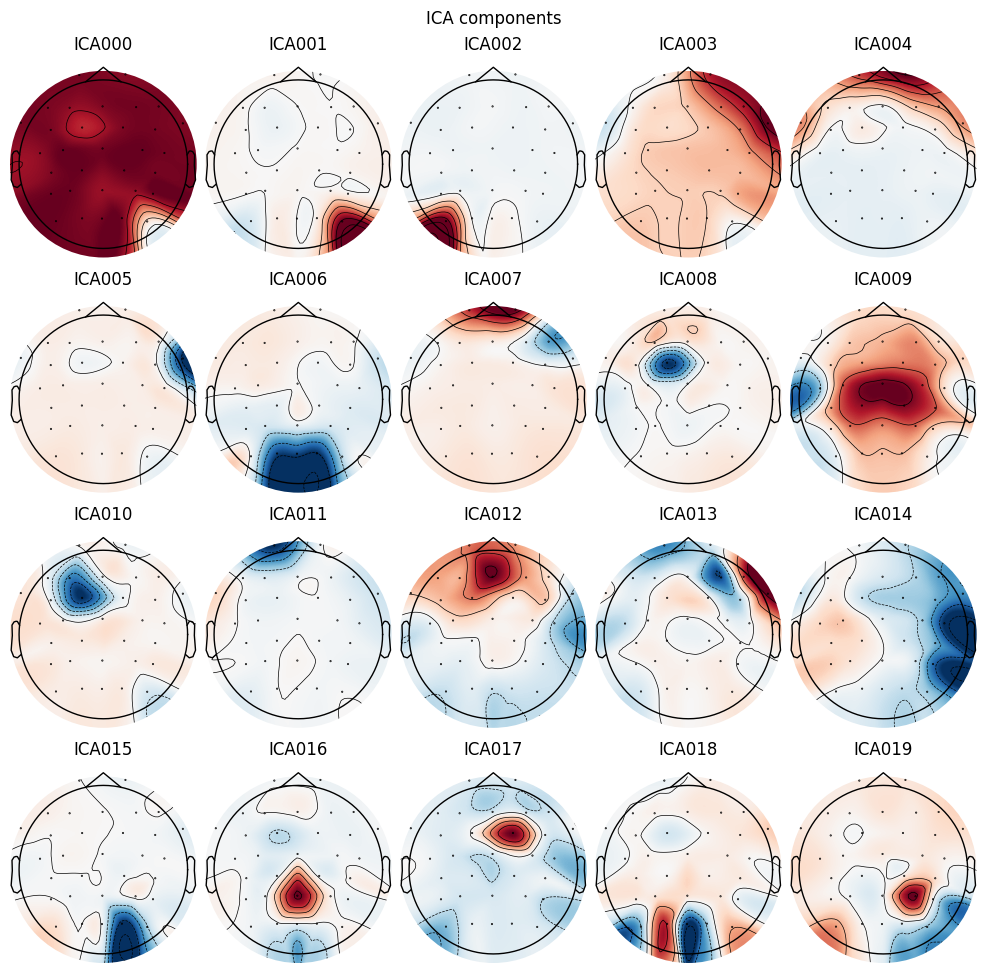

Using EOG channel: Fp1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


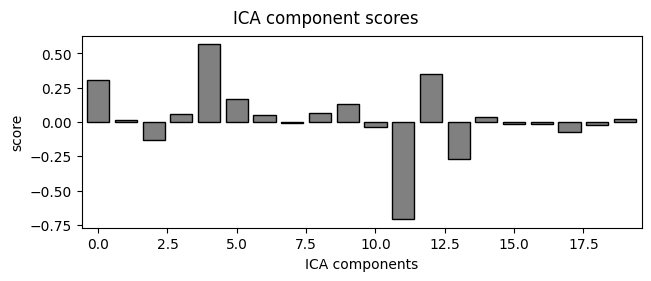

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 1 ICA component
    Projecting back using 32 PCA components
Now printing raw graph


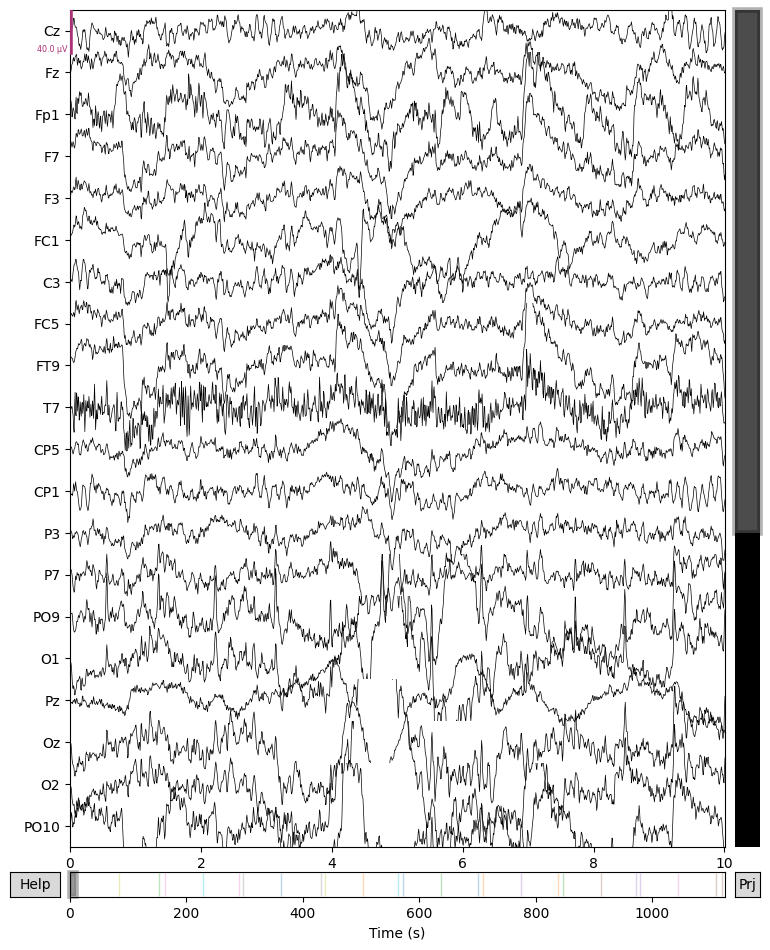

Now printing cleaned graph


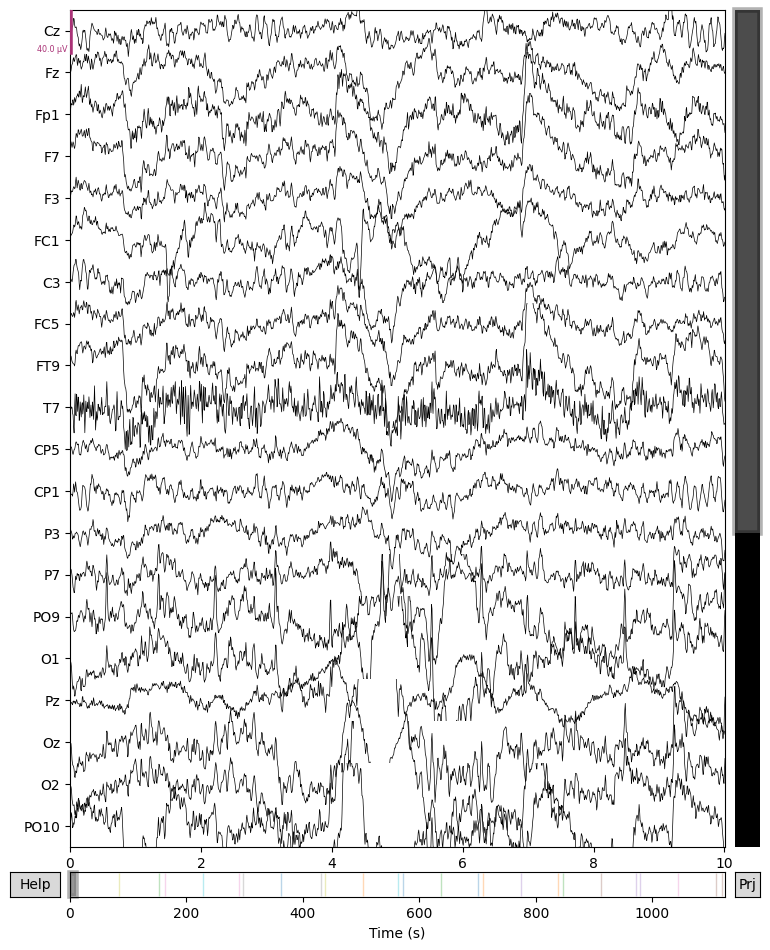

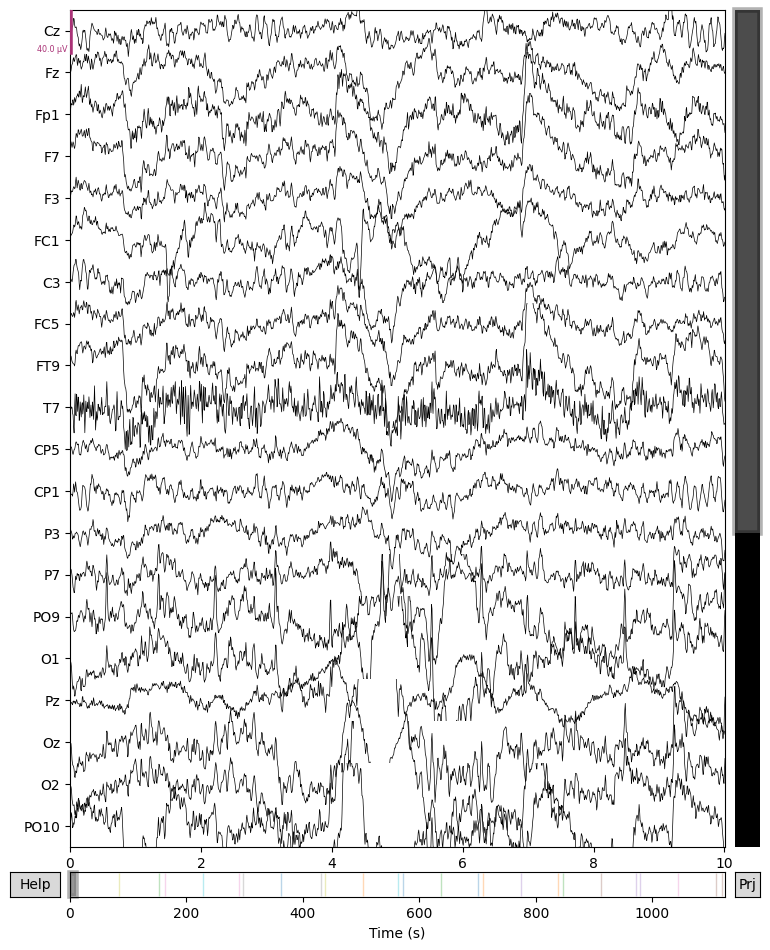

In [2]:
import mne
import numpy as np

# Read your EDF file
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )


events, event_dict = mne.events_from_annotations(raw)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.filter(l_freq=0.5, h_freq=40,n_jobs=4)  # Apply band-pass filter
# Define baseline period (0 to 30 seconds)
baseline_start = 0
baseline_end = 30

# Get time periods for events with "videos\" in their descriptions, skipping the first 30 seconds
sfreq = raw.info['sfreq']  # Get the sampling frequency
time_periods = []
video_events = []
for event_idx, event in enumerate(events):
    onset_sample = event[0]
    duration_seconds = event[2] / sfreq
    event_description = list(event_dict.keys())[list(event_dict.values()).index(event[2])]
    if "videos\\" in event_description:
        start_time = raw.times[onset_sample] + 30  # Skip the first 30 seconds
        end_time = start_time + 30  # Grab the subsequent 30 seconds
        time_period = (start_time, end_time)
        time_periods.append(time_period)
        video_events.append((event_description, time_period))

# Extract baseline period
baseline_data, _ = raw[:, int(baseline_start * sfreq):int(baseline_end * sfreq)]

# Print video events with their corresponding time periods
for event_idx, (event_description, time_period) in enumerate(video_events):
    print(f"Event {event_idx + 1}: {event_description}, Time Period: {time_period[0]} - {time_period[1]} seconds")

# Apply ICA to the raw EEG data to remove artifacts
from mne.preprocessing import ICA

# Set up ICA
ica = ICA(n_components=20, random_state=97, max_iter=800)

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components that capture eye blinks
ica.plot_components()

# Use built-in methods to automatically find EOG-like components (since we don't have EOG data, we use EEG channels)
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name='Fp1')  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(eog_scores)

# Exclude the identified EOG-related components
ica.exclude = eog_indices

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())
print('Now printing raw graph')
raw.plot()
# Plot the cleaned data to verify the result
print('Now printing cleaned graph')
raw_clean.plot()

In [11]:
for i in dir(ica):
    if '__' in i: # Exclude ones we don't want, private, etc. 
        continue
    print(i)

_apply_epochs
_apply_evoked
_apply_raw
_check_exclude
_check_n_pca_components
_check_target
_compute_pre_whitener
_do_proj
_export_info
_find_bads_ch
_fit
_fit_epochs
_fit_raw
_get_ctps_threshold
_get_explained_variance_ratio_one_ch_type
_get_infos_for_repr
_get_picks
_ica_names
_max_pca_components
_pick_sources
_pre_whiten
_repr_html_
_reset
_sources_as_epochs
_sources_as_evoked
_sources_as_raw
_transform
_transform_epochs
_transform_evoked
_transform_raw
_update_ica_names
_update_mixing_matrix
allow_ref_meg
apply
ch_names
compensation_grade
copy
current_fit
exclude
find_bads_ecg
find_bads_eog
find_bads_muscle
find_bads_ref
fit
fit_params
get_channel_types
get_components
get_explained_variance_ratio
get_sources
info
labels_
max_iter
method
mixing_matrix_
n_components
n_components_
n_iter_
n_pca_components
n_samples_
noise_cov
pca_components_
pca_explained_variance_
pca_mean_
plot_components
plot_overlay
plot_properties
plot_scores
plot_sources
pre_whitener_
random_state
reject_
save
s

# Let's try find_bads_eog
# Remaining methods to try:
# find_bads_ecg
# find_bads_muscle
# find_bads_ref

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandw

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Fitting ICA to data using 32 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 4.2s.


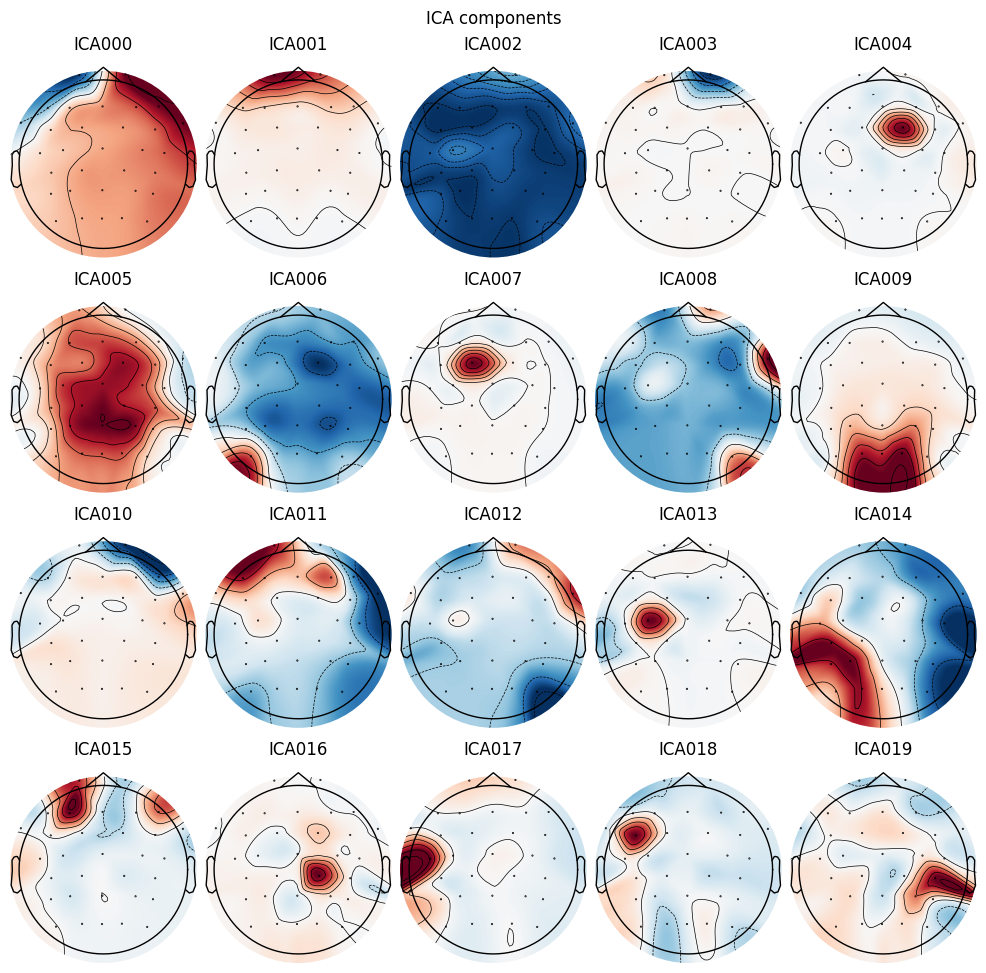

Using EOG channel: Fp1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


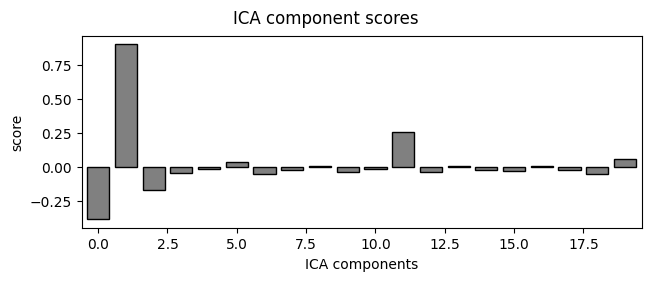

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 32 PCA components
Raw file
Using matplotlib as 2D backend.


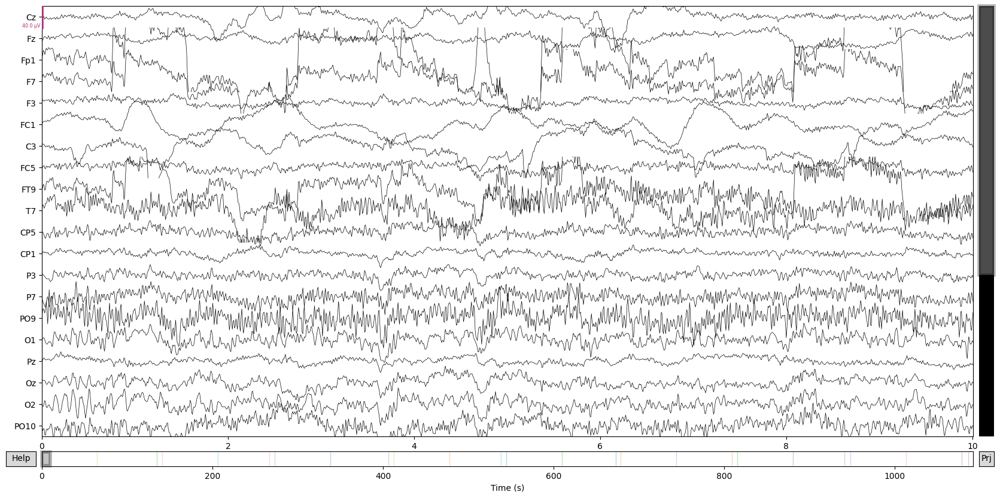

Cleaned file


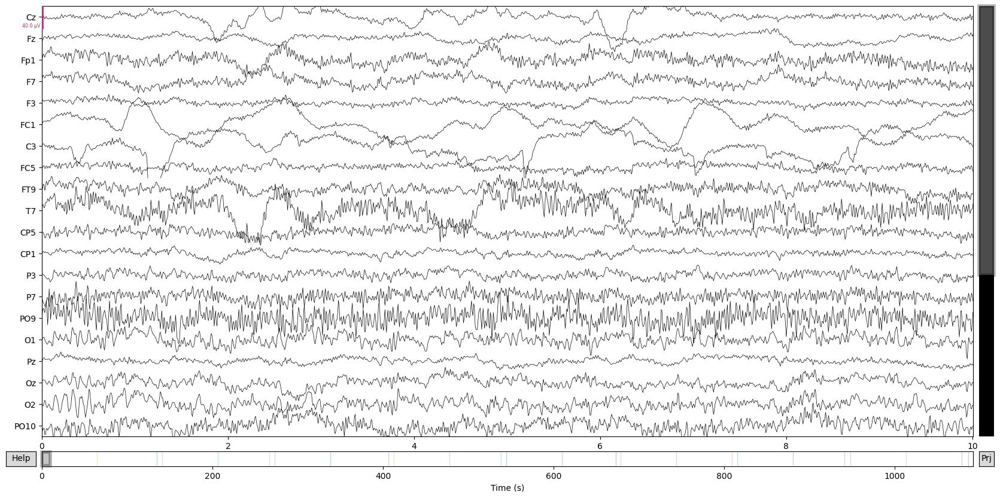

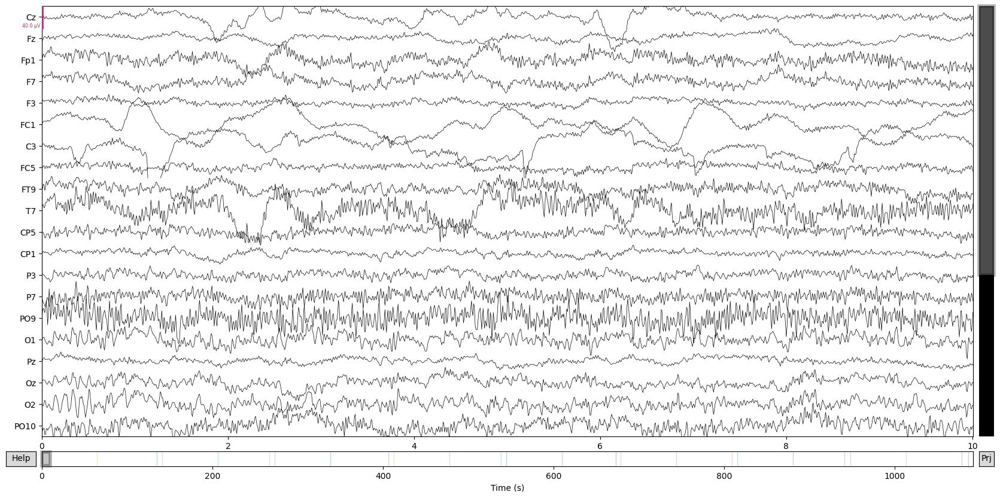

In [1]:

import mne
from mne.preprocessing import ICA

# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )


eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Select only EEG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.filter(l_freq=0.5, h_freq=40)  # Apply band-pass filter

# # Apply ICA to the raw EEG data to remove artifacts

# Set up ICA
ica = ICA(n_components=20, random_state=97, max_iter=800)

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components that capture eye blinks
ica.plot_components()

# Use built-in methods to automatically find EOG-like components (since we don't have EOG data, we use EEG channels)
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name='Fp1')  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(eog_scores)

# Exclude the identified EOG-related components
ica.exclude = eog_indices

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())

# Plot the raw and cleaned data for comparison using MNE's plotting
print('Raw file')
raw.plot(title='Raw EEG Data')
print('Cleaned file')
raw_clean.plot(title='Cleaned EEG Data')


Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandw

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 32 components
Fitting ICA took 8.2s.


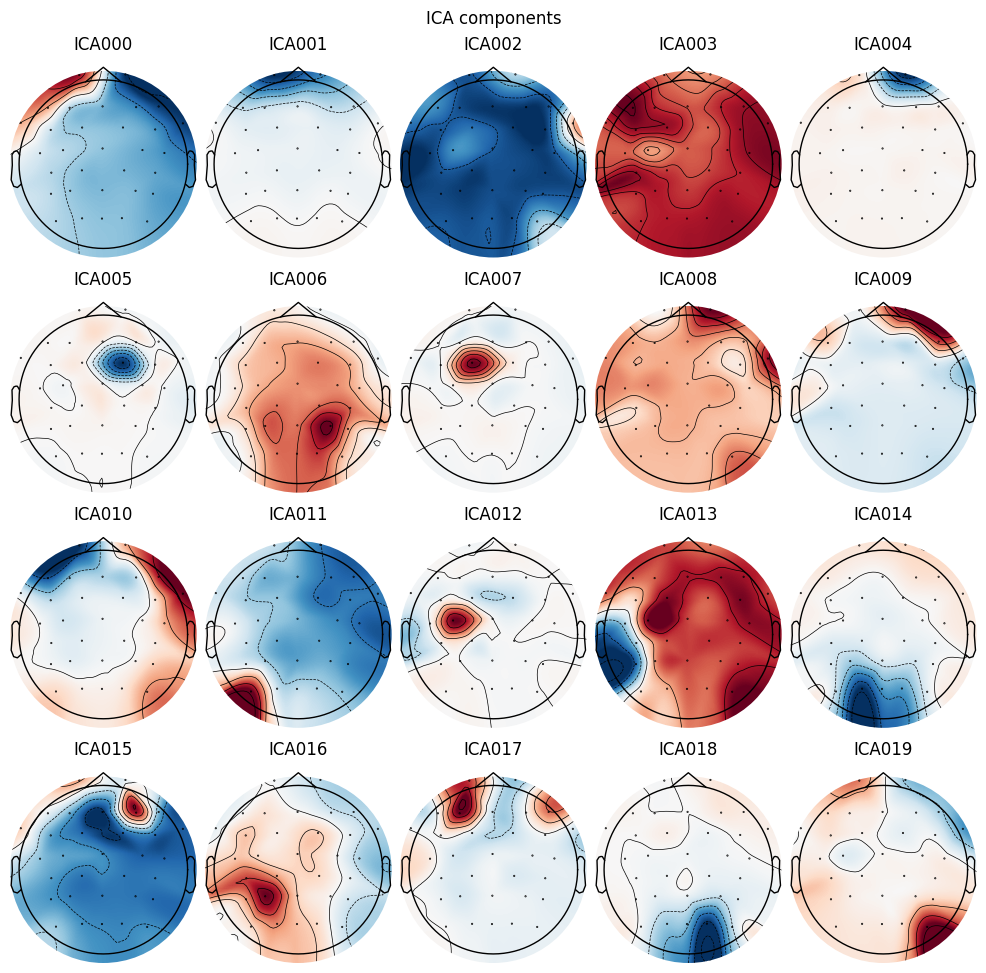

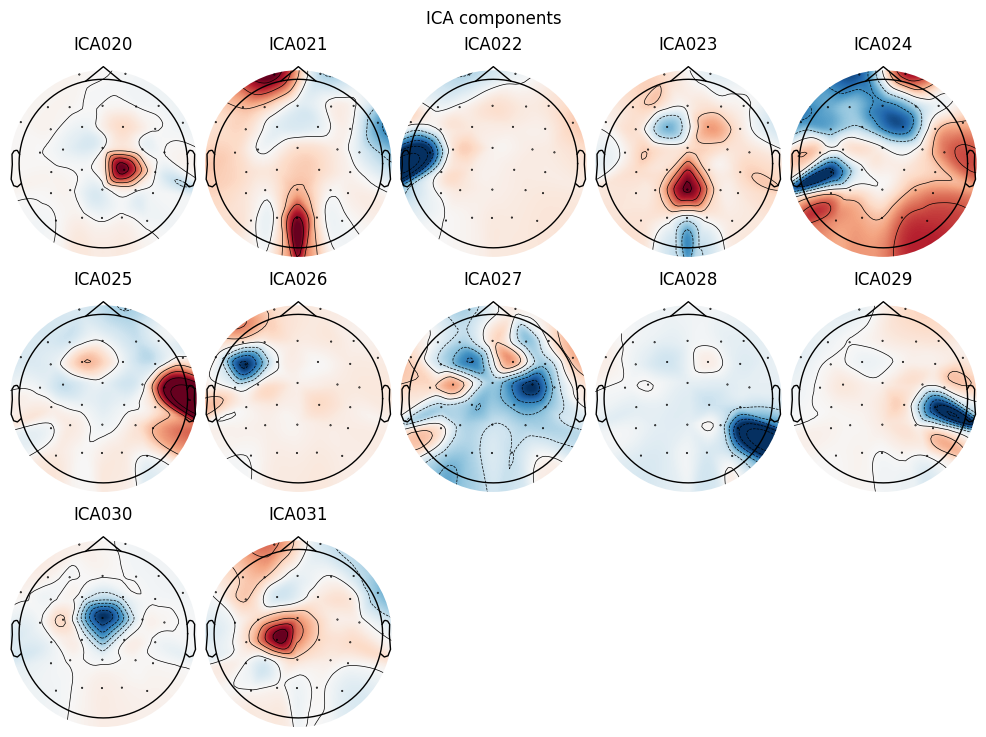

Effective window size : 16.000 (s)


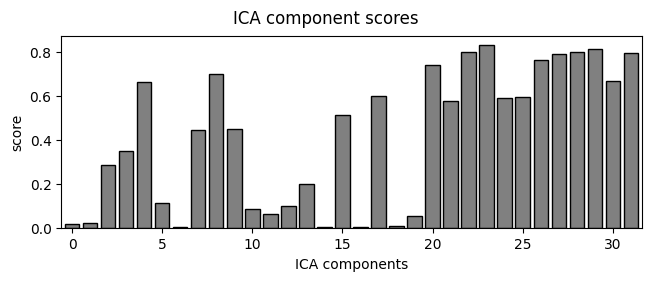

Applying ICA to Raw instance
    Transforming to ICA space (32 components)
    Zeroing out 21 ICA components
    Projecting back using 32 PCA components
Raw file


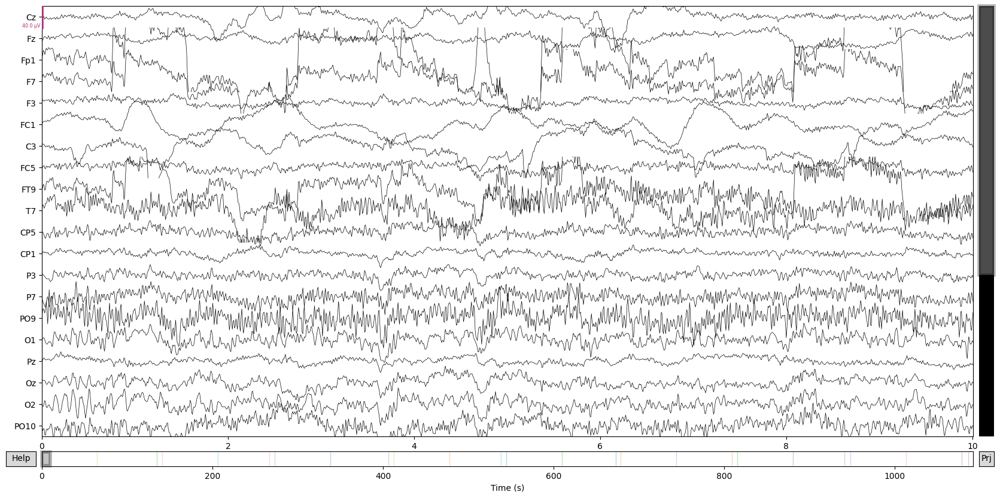

Cleaned file


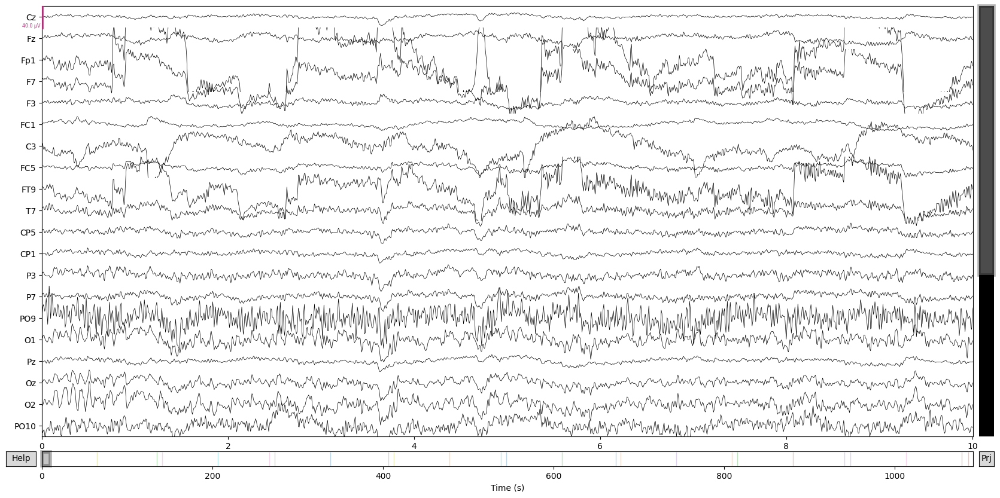

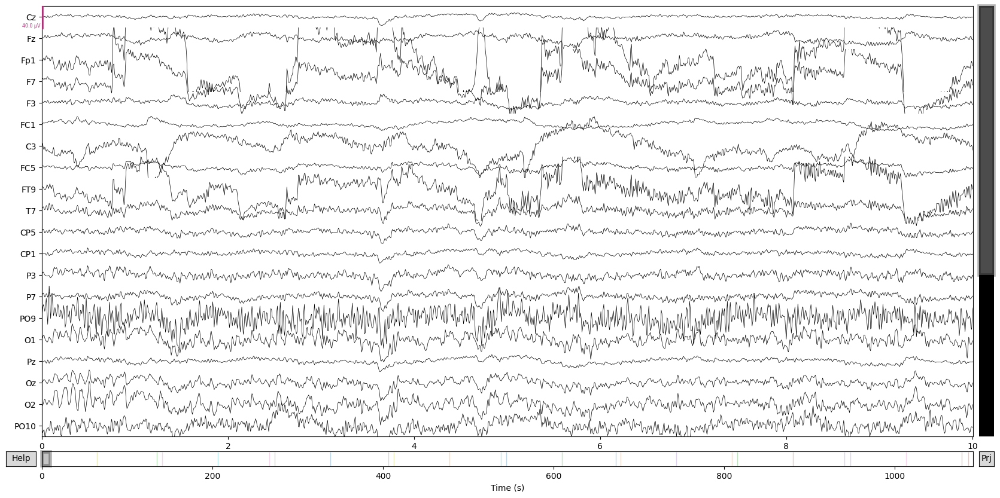

In [14]:
# find_bads_muscle

# Next: # find_bads_ecg # find_bads_ref

import mne

# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )


eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Select only EEG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.filter(l_freq=0.5, h_freq=40)  # Apply band-pass filter

# Apply ICA to the raw EEG data to remove artifacts
from mne.preprocessing import ICA

# Set up ICA
ica = ICA(n_components=32, random_state=97, max_iter=800)

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components that capture eye blinks
ica.plot_components()

# Use built-in methods to automatically find EOG-like components (since we don't have EOG data, we use EEG channels)
eog_indices, eog_scores = ica.find_bads_muscle(raw)  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(eog_scores)

# Exclude the identified EOG-related components
ica.exclude = eog_indices

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())

# Plot the raw and cleaned data for comparison using MNE's plotting functions
print('Raw file')
raw.plot(title='Raw EEG Data')
print('Cleaned file')
raw_clean.plot(title='Cleaned EEG Data')

## We don't seem to be able to find bad refs due to not having meg channels, requires further analysis

Extracting EDF parameters from r:\FINAL_EDF_REPO\EDF_analysis\Archive\EDF+\254362\254362.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper t

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 20 components
Fitting ICA took 9.7s.


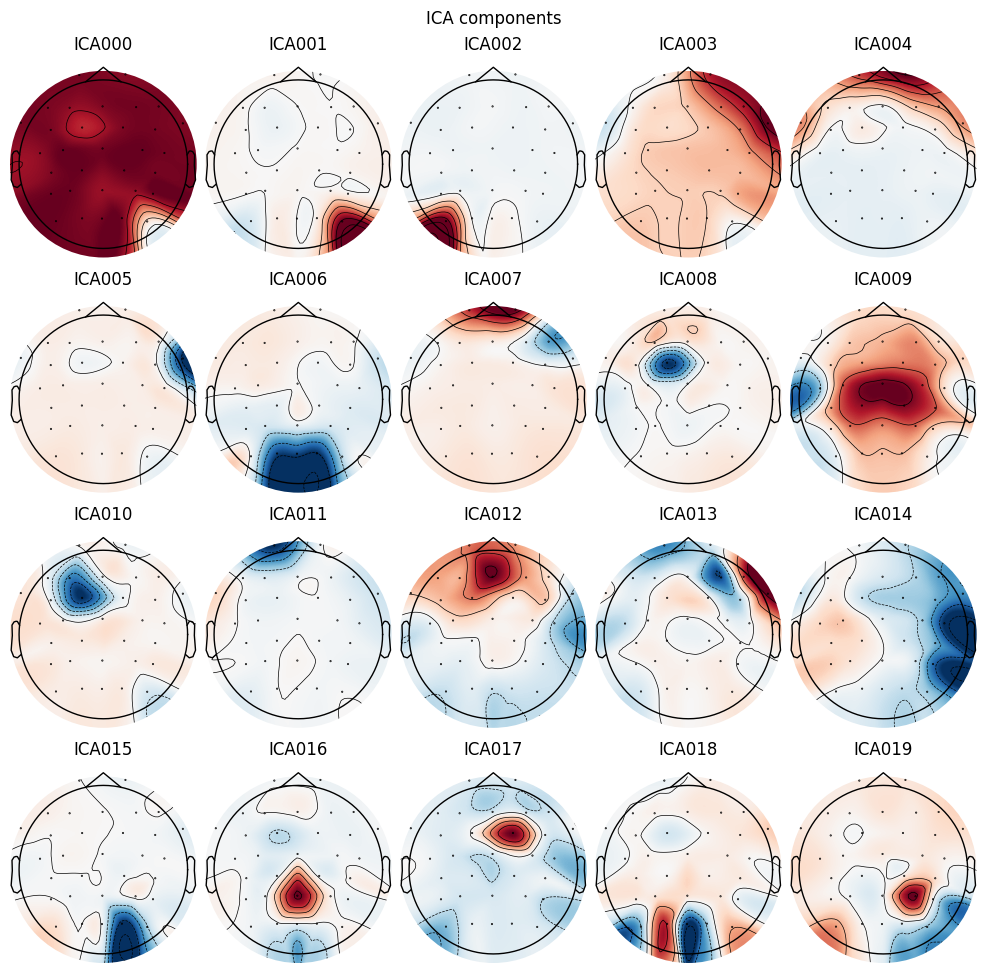

Using EOG channel: Fp1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


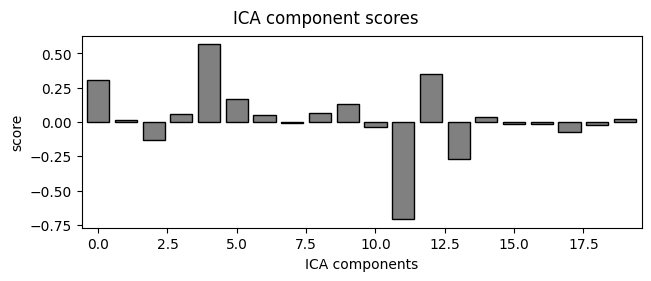

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 1 ICA component
    Projecting back using 32 PCA components


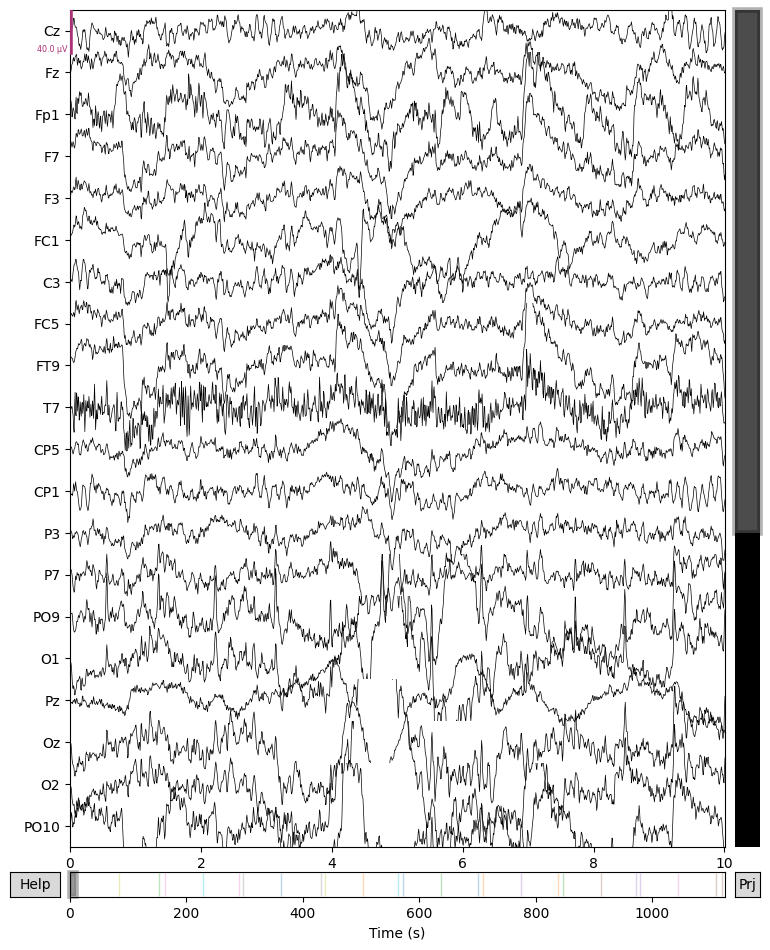

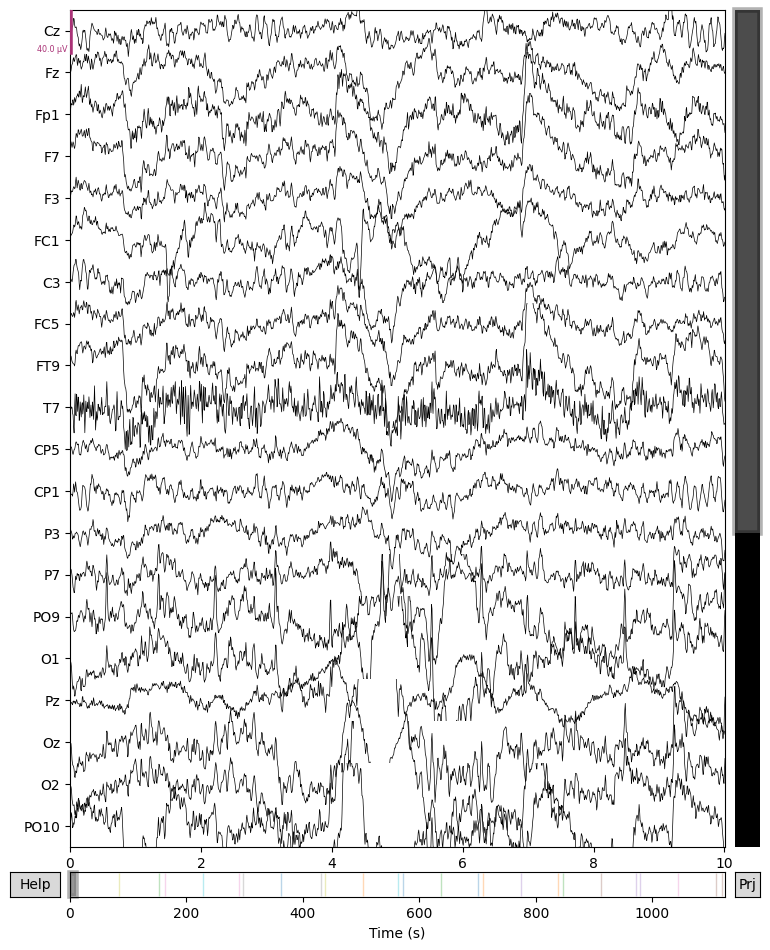

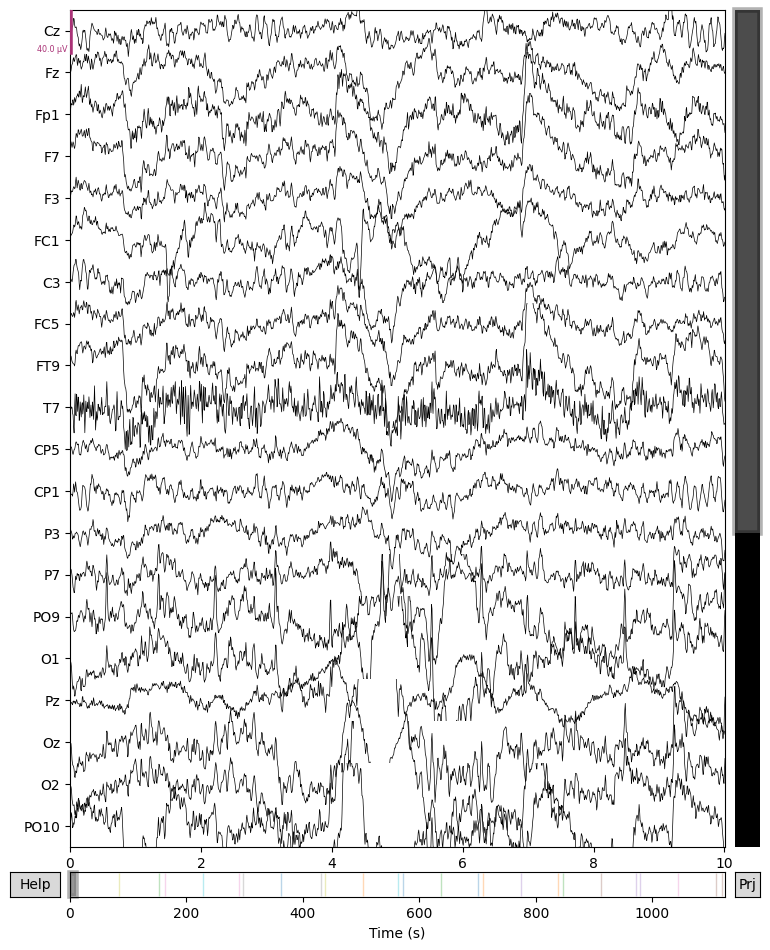

In [4]:
# Let's try find_bads_ref
# Remaining methods to try:
# find_bads_ecg

import mne
from mne.preprocessing import ICA
# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )


eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Select only EEG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.filter(l_freq=0.5, h_freq=40)  # Apply band-pass filter

# Apply ICA to the raw EEG data to remove artifacts
# Set up ICA
ica = ICA(n_components=20, random_state=97, max_iter=800)

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components that capture eye blinks
ica.plot_components()

# Use built-in methods to automatically find EOG-like components (since we don't have EOG data, we use EEG channels)
eog_indices, eog_scores = ica.find_bads_eog(raw,ch_name='Fp1')  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(eog_scores)

# Exclude the identified EOG-related components
ica.exclude = eog_indices

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())

# Plot the raw and cleaned data for comparison using MNE's plotting functions
raw.plot(title='Raw EEG Data')
raw_clean.plot(title='Cleaned EEG Data')


## ECG artifacts seem least prevalent of all for eeg recordings

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwid

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 20 components
Fitting ICA took 5.2s.


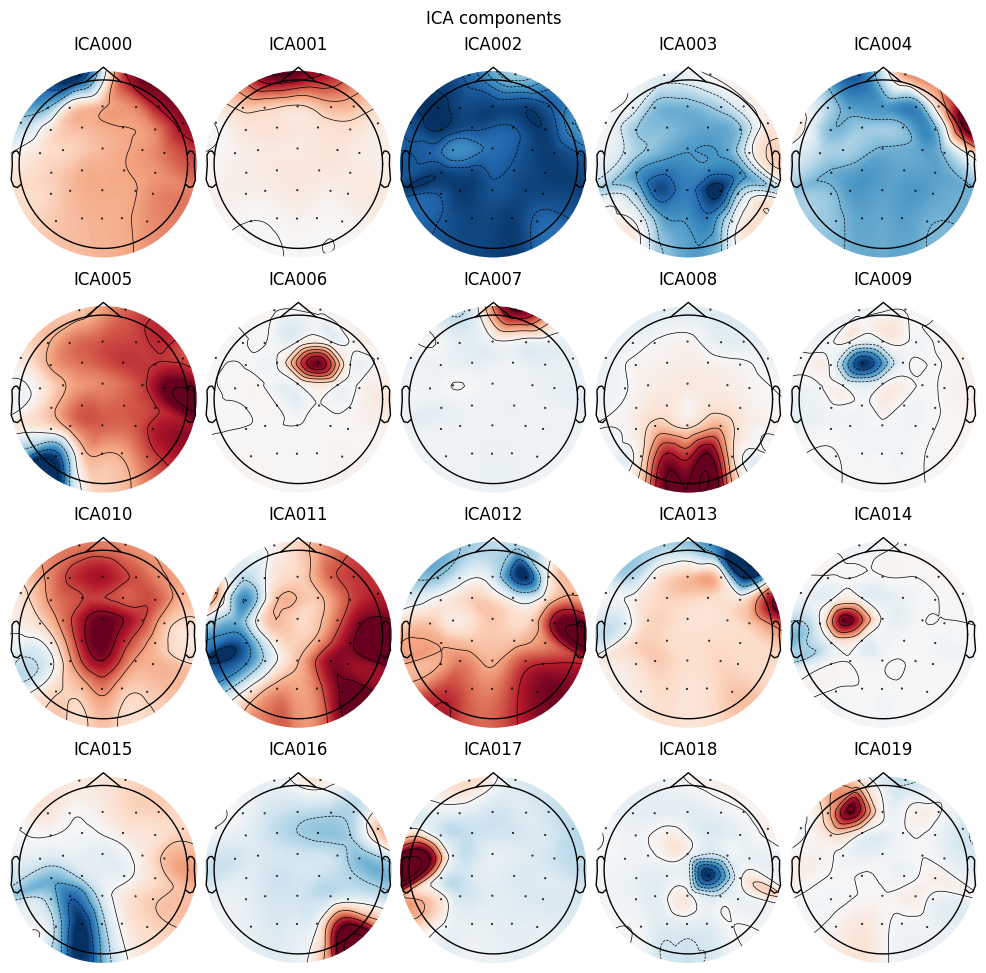

Using threshold: 0.44 for CTPS ECG detection
Using channel Fp1 to identify heart beats.
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 1280 samples (10.000 s)

Number of ECG events detected : 1025 (average pulse 56 / min.)
Not setting metadata
1025 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
Using data from preloaded Raw for 1025 events and 129 original time points ...
0 bad epochs dropped


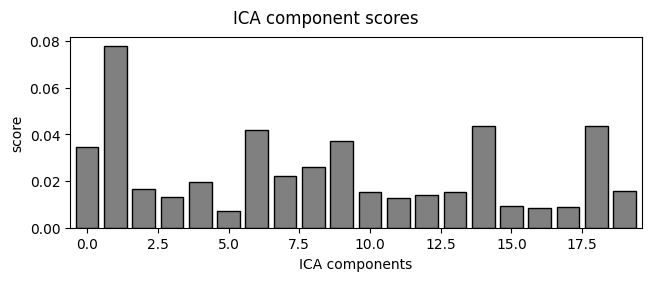

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 0 ICA components
    Projecting back using 32 PCA components
Using matplotlib as 2D backend.


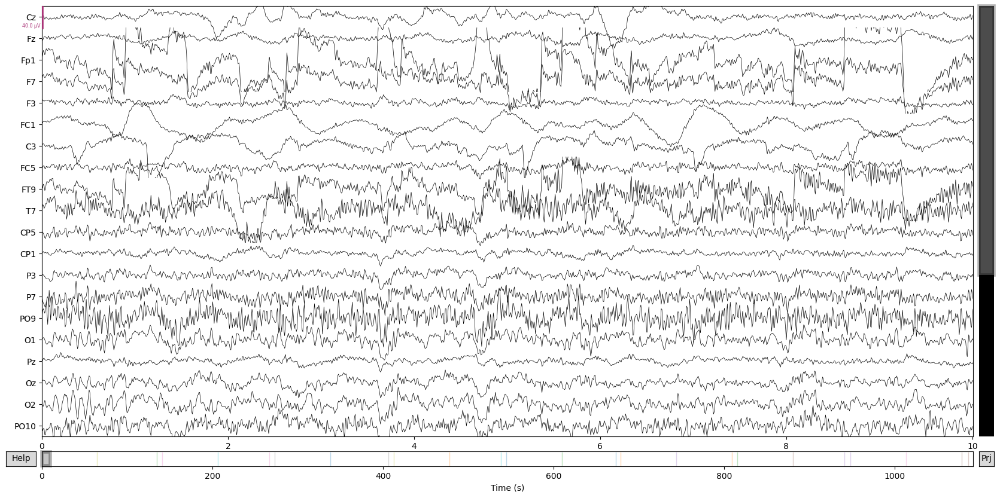

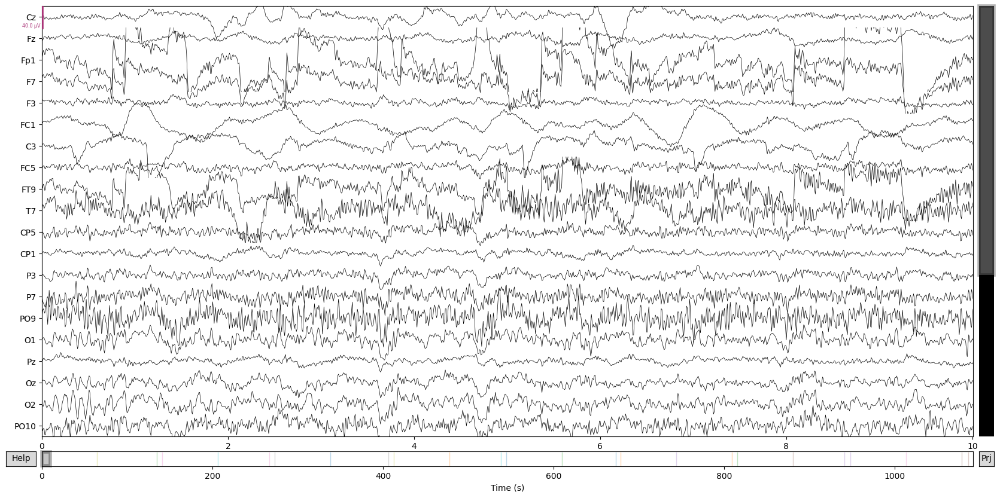

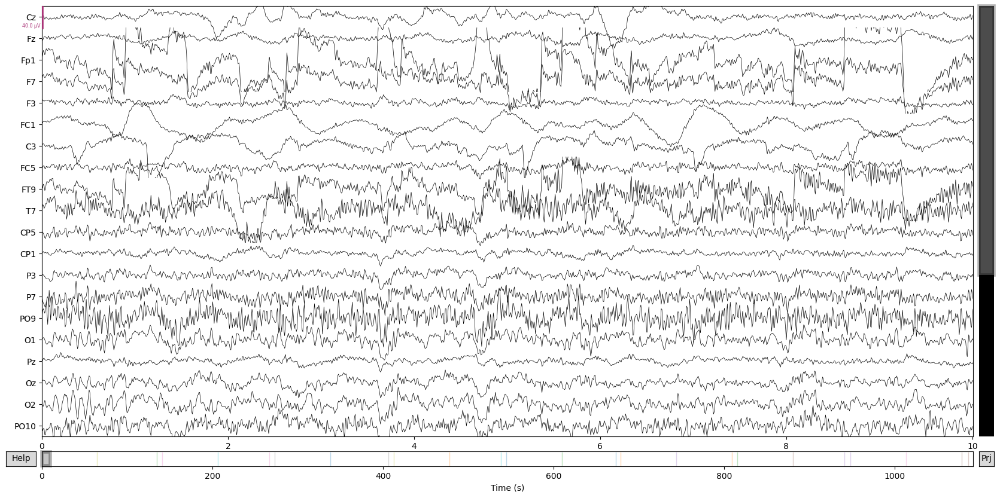

In [5]:
# Let's try find_bads_ecg

# Let's try find_bads_ref
# Remaining methods to try:
# find_bads_ecg

import mne
from mne.preprocessing import ICA
# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )



eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Select only EEG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter

# Apply ICA to the raw EEG data to remove artifacts
# Set up ICA
ica = ICA(n_components=20, random_state=97, max_iter=800) #, max_iter=800 # removed to try auto

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components that capture eye blinks
ica.plot_components()

# Use built-in methods to automatically find EOG-like components (since we don't have EOG data, we use EEG channels)
eog_indices, eog_scores = ica.find_bads_ecg(raw,ch_name='Fp1')  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(eog_scores)

# Exclude the identified EOG-related components
ica.exclude = eog_indices

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())

# Plot the raw and cleaned data for comparison using MNE's plotting functions
raw.plot(title='Raw EEG Data')
raw_clean.plot(title='Cleaned EEG Data')


## Let me try a simplified heart only one

Extracting EDF parameters from r:\FINAL_EDF_REPO\EDF_analysis\Archive\EDF+\254362\254362.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper tra

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 20 components
Fitting ICA took 6.9s.


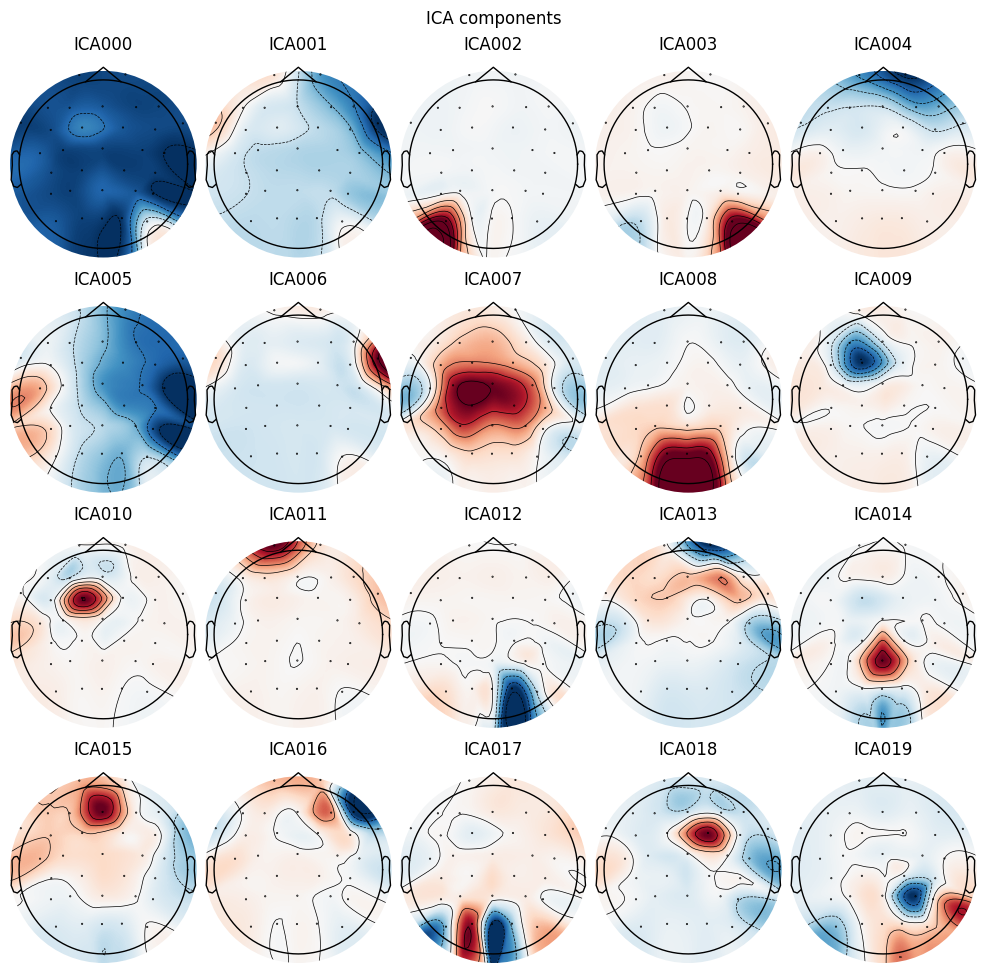

Using threshold: 0.44 for CTPS ECG detection
Using channel Fp2 to identify heart beats.
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 1280 samples (10.000 s)

Number of ECG events detected : 1574 (average pulse 83.94666666666667 / min.)
Not setting metadata
1574 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
Using data from preloaded Raw for 1574 events and 129 original time points ...
1 bad epochs dropped


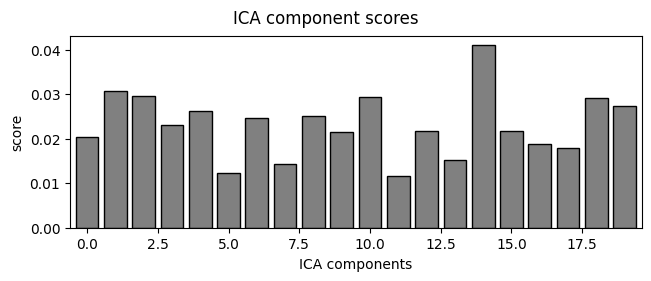

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 0 ICA components
    Projecting back using 32 PCA components
Using matplotlib as 2D backend.


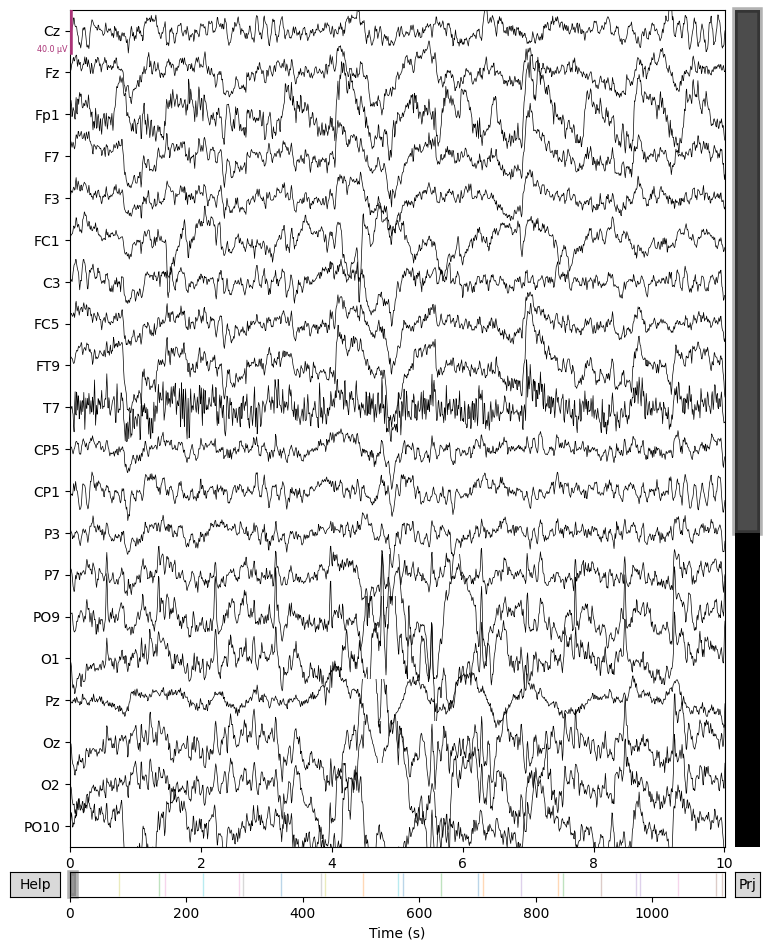

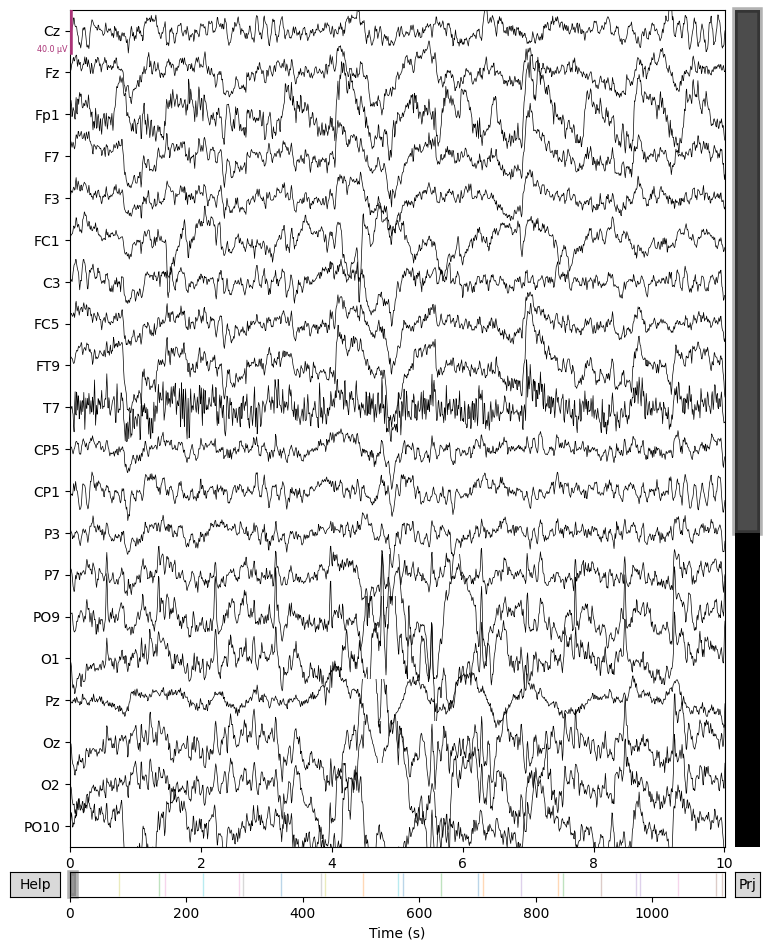

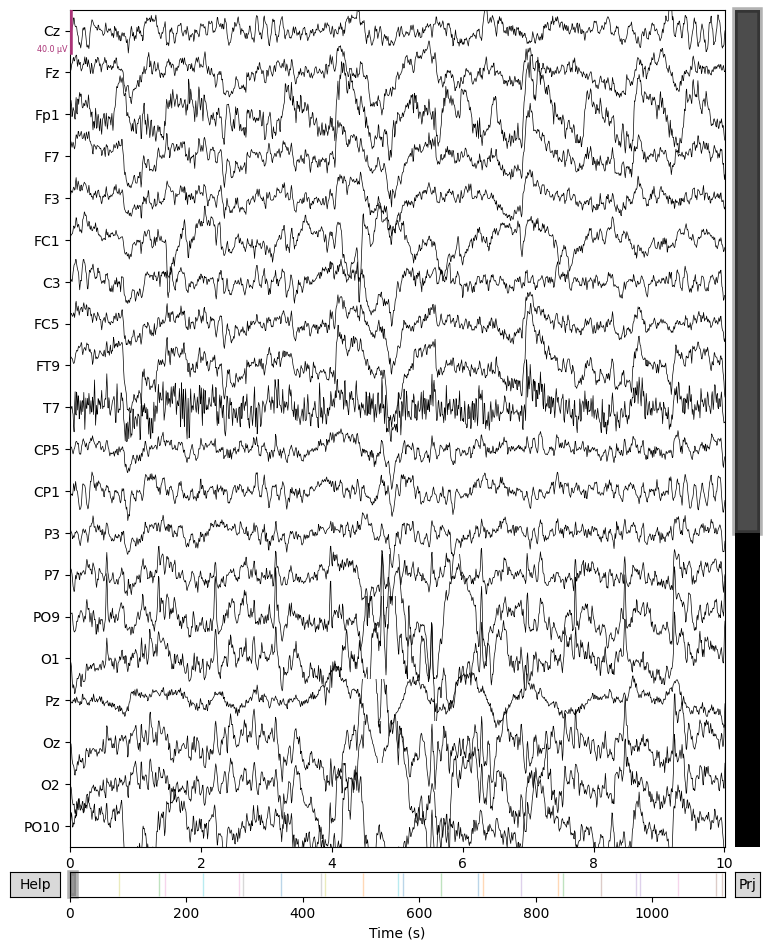

In [1]:
# Let's try find_bads_ecg
# Let's try find_bads_ref
# Remaining methods to try:
# find_bads_ecg

import mne
from mne.preprocessing import ICA
# Read your EDF file
raw = raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=['TimestampS', 'TimestampMs', 'OrTimestampS', 'OrTimestampMs', 'Counter', 'Interpolated', 'HighBitFlex', 'SaturationFlag', 'RawCq', 'Battery', 'BatteryPercent', 'MarkerHardware', 'CQ.Cz', 'CQ.Fz', 'CQ.Fp1', 'CQ.F7', 'CQ.F3', 'CQ.FC1', 'CQ.C3', 'CQ.FC5', 'CQ.FT9', 'CQ.T7', 'CQ.CP5', 'CQ.CP1', 'CQ.P3', 'CQ.P7', 'CQ.PO9', 'CQ.O1', 'CQ.Pz', 'CQ.Oz', 'CQ.O2', 'CQ.PO10', 'CQ.P8', 'CQ.P4', 'CQ.CP2', 'CQ.CP6', 'CQ.T8', 'CQ.FT10', 'CQ.FC6', 'CQ.C4', 'CQ.FC2', 'CQ.F4', 'CQ.F8', 'CQ.Fp2', 'CQ.Overall', 'EQ.SampleRateQua', 'EQ.OVERALL', 'EQ.Cz', 'EQ.Fz', 'EQ.Fp1', 'EQ.F7', 'EQ.F3', 'EQ.FC1', 'EQ.C3', 'EQ.FC5', 'EQ.FT9', 'EQ.T7', 'EQ.CP5', 'EQ.CP1', 'EQ.P3', 'EQ.P7', 'EQ.PO9', 'EQ.O1', 'EQ.Pz', 'EQ.Oz', 'EQ.O2', 'EQ.PO10', 'EQ.P8', 'EQ.P4', 'EQ.CP2', 'EQ.CP6', 'EQ.T8', 'EQ.FT10', 'EQ.FC6', 'EQ.C4', 'EQ.FC2', 'EQ.F4', 'EQ.F8', 'EQ.Fp2', 'MOT.TimestampS', 'MOT.TimestampMs', 'MOT.OrTimestampS', 'MOT.OrTimestampM', 'MOT.CounterMems', 'MOT.Interpolated', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ'],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )



eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Select only EEG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter

# Apply ICA to the raw EEG data to remove artifacts
# Set up ICA
ica = ICA(n_components=20, random_state=97, max_iter=800) #, max_iter=800 # removed to try auto

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components that capture hreart beats
ica.plot_components()

# Use built-in methods to automatically find ecg-like components (since we don't have ecg data, we use EEG channels)
ecg_indices, ecg_scores = ica.find_bads_ecg(raw,'Fp2')  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(ecg_scores)

# Exclude the identified ecg-related components
ica.exclude = ecg_indices

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())

# Plot the raw and cleaned data for comparison using MNE's plotting functions
raw.plot(title='Raw EEG Data')
raw_clean.plot(title='Cleaned EEG Data')
